# Deep Convolutional GANs (DCGANs)

In [1]:
%matplotlib inline
import numpy as np
import torch
import matplotlib.pyplot as plt

In [2]:
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

# number of subprocesses to use for data loading
num_workers = 6
# how many samples per batch to load
batch_size = 64

# Define the transformations to be applied to the images
transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Resize the images to 64x64
    transforms.ToTensor(),  # Convert the images to tensors
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize the images
])

# Set the path to your manually downloaded dataset directory
dataset_dir = 'processed_celeba_small/celeba'

# Create an instance of the ImageFolder dataset
train_data = datasets.ImageFolder(root=dataset_dir, transform=transform)

# Prepare the data loader
train_loader = DataLoader(train_data, 
                          batch_size=batch_size, 
                          shuffle=True,
                          num_workers=num_workers, 
                          drop_last=True,
                          pin_memory=False)

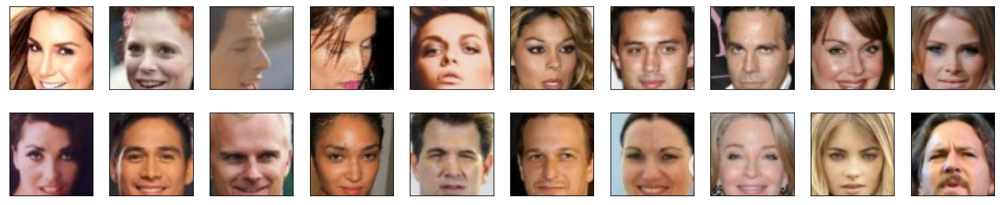

In [3]:
def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = train_data[idx][0].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

### Complete Network

In [4]:
from models import Generator, Discriminator

In [5]:
img_size = 64
z_size = 128

D = Discriminator(img_size= img_size)
G = Generator(latent_dim=z_size, img_size=img_size)

In [6]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model_D = D.to(device)
model_G = G.to(device)

### Discriminator and Generator Losses

In [7]:
from loss import discriminator_loss, generator_loss

### Optimizers

In [8]:
import torch.optim as optim
from torch.optim.lr_scheduler import MultiStepLR

# Optimizers
lr_G = 0.001
lr_D = 0.0001
num_epochs = 20

# Create optimizers for the discriminator and generator
d_optimizer = optim.Adam(model_D.parameters(), lr=lr_D, betas=(0.5, 0.999))
g_optimizer = optim.Adam(model_G.parameters(), lr=lr_G, betas=(0.5, 0.999))

# Learning rate scheduler
# Set the list of milestones when you want to adjust the learning rate
d_milestones = [15]
g_milestones = [3, 8, 15]

d_scheduler = MultiStepLR(d_optimizer, milestones=d_milestones, gamma=0.5)
g_scheduler = MultiStepLR(g_optimizer, milestones=g_milestones, gamma=0.5)

---
### Training

Training will involve alternating between training the discriminator and the generator. We'll use our functions `real_loss` and `fake_loss` to help us calculate the discriminator losses in all of the following cases.

#### Discriminator training
1. Compute the discriminator loss on real, training images        
2. Generate fake images
3. Compute the discriminator loss on fake, generated images     
4. Add up real and fake loss
5. Perform backpropagation + an optimization step to update the discriminator's weights

#### Generator training
1. Generate fake images
2. Compute the discriminator loss on fake images, using **flipped** labels!
3. Perform backpropagation + an optimization step to update the generator's weights

##### Saving Samples

As we train, we'll also print out some loss statistics and save some generated "fake" samples.

In [9]:
from training_helper import training

2024-03-30 02:13:09 | Epoch [1/20] | Batch 0/895 | d_loss: 1.3789 | g_loss: 0.6932
2024-03-30 02:13:19 | Epoch [1/20] | Batch 50/895 | d_loss: 1.3585 | g_loss: 1.3865
2024-03-30 02:13:29 | Epoch [1/20] | Batch 100/895 | d_loss: 1.1111 | g_loss: 1.3979
2024-03-30 02:13:39 | Epoch [1/20] | Batch 150/895 | d_loss: 1.4104 | g_loss: 1.5710
2024-03-30 02:13:49 | Epoch [1/20] | Batch 200/895 | d_loss: 1.4696 | g_loss: 1.4988
2024-03-30 02:13:59 | Epoch [1/20] | Batch 250/895 | d_loss: 1.3625 | g_loss: 1.6014
2024-03-30 02:14:09 | Epoch [1/20] | Batch 300/895 | d_loss: 1.2289 | g_loss: 1.5430
2024-03-30 02:14:19 | Epoch [1/20] | Batch 350/895 | d_loss: 0.9639 | g_loss: 1.8272
2024-03-30 02:14:29 | Epoch [1/20] | Batch 400/895 | d_loss: 1.0938 | g_loss: 1.7865
2024-03-30 02:14:40 | Epoch [1/20] | Batch 450/895 | d_loss: 1.2967 | g_loss: 1.8540
2024-03-30 02:14:51 | Epoch [1/20] | Batch 500/895 | d_loss: 0.9146 | g_loss: 1.8219
2024-03-30 02:15:02 | Epoch [1/20] | Batch 550/895 | d_loss: 1.3706 

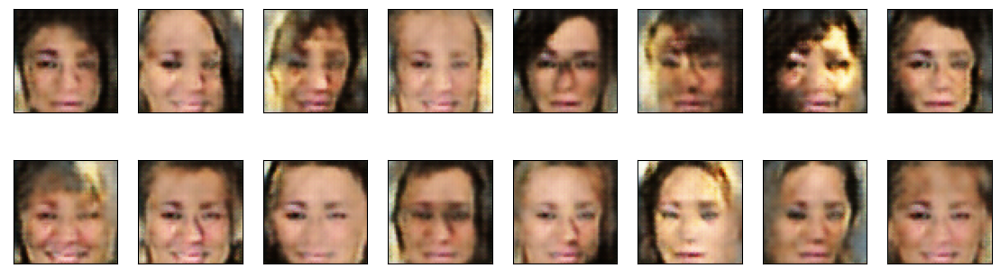

2024-03-30 02:16:17 | Epoch [2/20] | Batch 0/895 | d_loss: 0.9804 | g_loss: 2.0205
2024-03-30 02:16:28 | Epoch [2/20] | Batch 50/895 | d_loss: 1.4053 | g_loss: 2.5761
2024-03-30 02:16:38 | Epoch [2/20] | Batch 100/895 | d_loss: 0.8705 | g_loss: 2.3063
2024-03-30 02:16:51 | Epoch [2/20] | Batch 150/895 | d_loss: 1.0368 | g_loss: 1.9968
2024-03-30 02:17:01 | Epoch [2/20] | Batch 200/895 | d_loss: 1.0663 | g_loss: 2.4579
2024-03-30 02:17:12 | Epoch [2/20] | Batch 250/895 | d_loss: 0.8324 | g_loss: 2.6308
2024-03-30 02:17:23 | Epoch [2/20] | Batch 300/895 | d_loss: 1.1034 | g_loss: 2.1947
2024-03-30 02:17:33 | Epoch [2/20] | Batch 350/895 | d_loss: 0.7256 | g_loss: 2.4436
2024-03-30 02:17:44 | Epoch [2/20] | Batch 400/895 | d_loss: 1.0065 | g_loss: 2.2376
2024-03-30 02:17:55 | Epoch [2/20] | Batch 450/895 | d_loss: 1.2198 | g_loss: 2.3929
2024-03-30 02:18:06 | Epoch [2/20] | Batch 500/895 | d_loss: 1.2572 | g_loss: 1.9550
2024-03-30 02:18:16 | Epoch [2/20] | Batch 550/895 | d_loss: 1.0520 

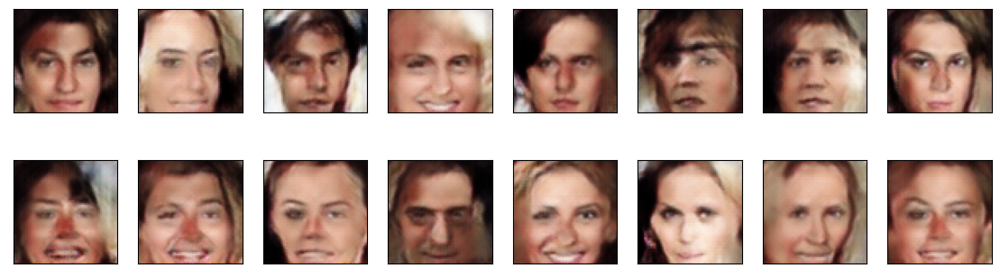

2024-03-30 02:19:36 | Epoch [3/20] | Batch 0/895 | d_loss: 0.7942 | g_loss: 2.4538
2024-03-30 02:19:46 | Epoch [3/20] | Batch 50/895 | d_loss: 1.3830 | g_loss: 2.3084
2024-03-30 02:19:57 | Epoch [3/20] | Batch 100/895 | d_loss: 1.0781 | g_loss: 2.0472
2024-03-30 02:20:08 | Epoch [3/20] | Batch 150/895 | d_loss: 0.9731 | g_loss: 1.6316
2024-03-30 02:20:18 | Epoch [3/20] | Batch 200/895 | d_loss: 0.9903 | g_loss: 2.3917
2024-03-30 02:20:29 | Epoch [3/20] | Batch 250/895 | d_loss: 0.8621 | g_loss: 2.2950
2024-03-30 02:20:40 | Epoch [3/20] | Batch 300/895 | d_loss: 1.0532 | g_loss: 2.3456
2024-03-30 02:20:51 | Epoch [3/20] | Batch 350/895 | d_loss: 0.9030 | g_loss: 2.2351
2024-03-30 02:21:02 | Epoch [3/20] | Batch 400/895 | d_loss: 1.1709 | g_loss: 1.8142
2024-03-30 02:21:13 | Epoch [3/20] | Batch 450/895 | d_loss: 0.7205 | g_loss: 2.2067
2024-03-30 02:21:23 | Epoch [3/20] | Batch 500/895 | d_loss: 0.9218 | g_loss: 2.3267
2024-03-30 02:21:34 | Epoch [3/20] | Batch 550/895 | d_loss: 1.0001 

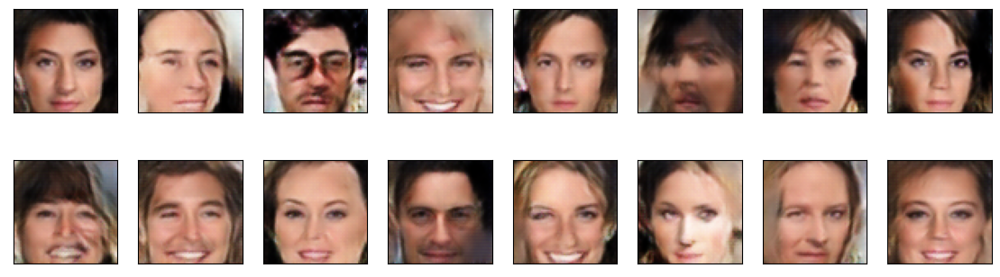

2024-03-30 02:22:52 | Epoch [4/20] | Batch 0/895 | d_loss: 1.0347 | g_loss: 1.9815
2024-03-30 02:23:04 | Epoch [4/20] | Batch 50/895 | d_loss: 0.8786 | g_loss: 1.9351
2024-03-30 02:23:15 | Epoch [4/20] | Batch 100/895 | d_loss: 1.0641 | g_loss: 2.1197
2024-03-30 02:23:25 | Epoch [4/20] | Batch 150/895 | d_loss: 1.0806 | g_loss: 1.9213
2024-03-30 02:23:36 | Epoch [4/20] | Batch 200/895 | d_loss: 0.7880 | g_loss: 1.7200
2024-03-30 02:23:47 | Epoch [4/20] | Batch 250/895 | d_loss: 0.9401 | g_loss: 1.8420
2024-03-30 02:23:57 | Epoch [4/20] | Batch 300/895 | d_loss: 0.9899 | g_loss: 1.5782
2024-03-30 02:24:08 | Epoch [4/20] | Batch 350/895 | d_loss: 0.9172 | g_loss: 2.1486
2024-03-30 02:24:19 | Epoch [4/20] | Batch 400/895 | d_loss: 0.8522 | g_loss: 1.4494
2024-03-30 02:24:29 | Epoch [4/20] | Batch 450/895 | d_loss: 0.9402 | g_loss: 2.6046
2024-03-30 02:24:40 | Epoch [4/20] | Batch 500/895 | d_loss: 0.9966 | g_loss: 1.7179
2024-03-30 02:24:51 | Epoch [4/20] | Batch 550/895 | d_loss: 0.9603 

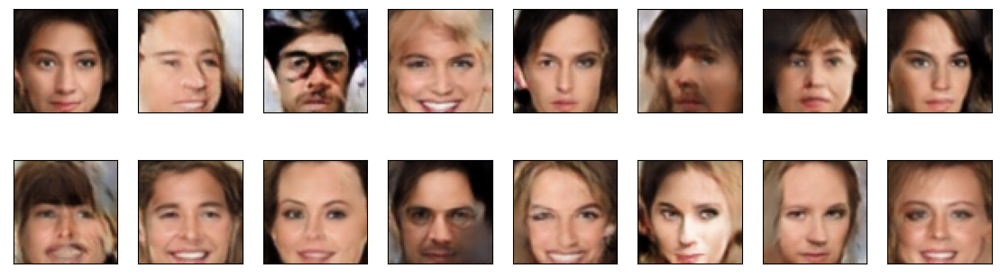

2024-03-30 02:26:09 | Epoch [5/20] | Batch 0/895 | d_loss: 0.6854 | g_loss: 1.8289
2024-03-30 02:26:20 | Epoch [5/20] | Batch 50/895 | d_loss: 0.7346 | g_loss: 1.8085
2024-03-30 02:26:30 | Epoch [5/20] | Batch 100/895 | d_loss: 0.7681 | g_loss: 1.8331
2024-03-30 02:26:41 | Epoch [5/20] | Batch 150/895 | d_loss: 1.0041 | g_loss: 2.2126
2024-03-30 02:26:52 | Epoch [5/20] | Batch 200/895 | d_loss: 0.8286 | g_loss: 2.1568
2024-03-30 02:27:07 | Epoch [5/20] | Batch 250/895 | d_loss: 0.7571 | g_loss: 2.2940
2024-03-30 02:27:18 | Epoch [5/20] | Batch 300/895 | d_loss: 1.1123 | g_loss: 2.6976
2024-03-30 02:27:28 | Epoch [5/20] | Batch 350/895 | d_loss: 1.1119 | g_loss: 1.5440
2024-03-30 02:27:39 | Epoch [5/20] | Batch 400/895 | d_loss: 0.8246 | g_loss: 1.8278
2024-03-30 02:27:50 | Epoch [5/20] | Batch 450/895 | d_loss: 1.0813 | g_loss: 2.5206
2024-03-30 02:28:00 | Epoch [5/20] | Batch 500/895 | d_loss: 1.0864 | g_loss: 2.0257
2024-03-30 02:28:11 | Epoch [5/20] | Batch 550/895 | d_loss: 0.7601 

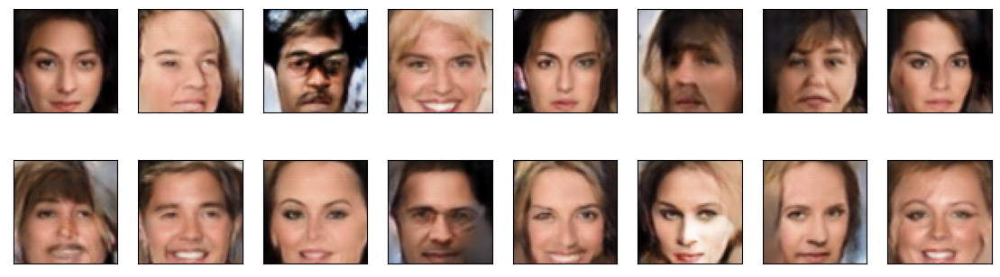

2024-03-30 02:29:30 | Epoch [6/20] | Batch 0/895 | d_loss: 0.9725 | g_loss: 2.3377
2024-03-30 02:29:41 | Epoch [6/20] | Batch 50/895 | d_loss: 0.8591 | g_loss: 1.9857
2024-03-30 02:29:52 | Epoch [6/20] | Batch 100/895 | d_loss: 0.7251 | g_loss: 1.5464
2024-03-30 02:30:02 | Epoch [6/20] | Batch 150/895 | d_loss: 0.9775 | g_loss: 1.7465
2024-03-30 02:30:13 | Epoch [6/20] | Batch 200/895 | d_loss: 0.8549 | g_loss: 1.8770
2024-03-30 02:30:24 | Epoch [6/20] | Batch 250/895 | d_loss: 0.8611 | g_loss: 2.1601
2024-03-30 02:30:35 | Epoch [6/20] | Batch 300/895 | d_loss: 0.6720 | g_loss: 2.7769
2024-03-30 02:30:45 | Epoch [6/20] | Batch 350/895 | d_loss: 0.6970 | g_loss: 2.4427
2024-03-30 02:30:56 | Epoch [6/20] | Batch 400/895 | d_loss: 0.8784 | g_loss: 1.6929
2024-03-30 02:31:11 | Epoch [6/20] | Batch 450/895 | d_loss: 0.6017 | g_loss: 2.2342
2024-03-30 02:31:22 | Epoch [6/20] | Batch 500/895 | d_loss: 0.7742 | g_loss: 2.0322
2024-03-30 02:31:33 | Epoch [6/20] | Batch 550/895 | d_loss: 1.0563 

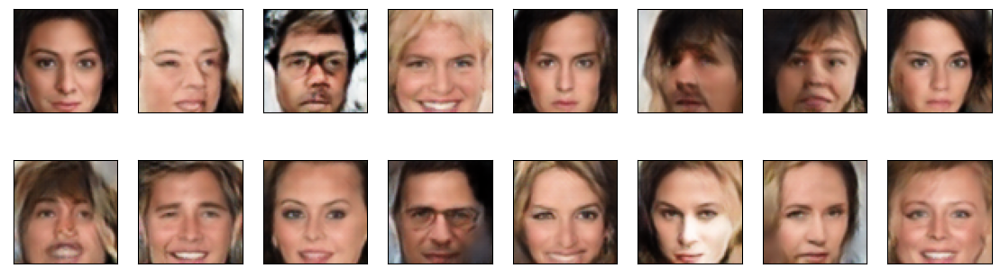

2024-03-30 02:32:49 | Epoch [7/20] | Batch 0/895 | d_loss: 0.7001 | g_loss: 2.4421
2024-03-30 02:32:59 | Epoch [7/20] | Batch 50/895 | d_loss: 0.6508 | g_loss: 1.6833
2024-03-30 02:33:10 | Epoch [7/20] | Batch 100/895 | d_loss: 1.0850 | g_loss: 1.9646
2024-03-30 02:33:21 | Epoch [7/20] | Batch 150/895 | d_loss: 0.6274 | g_loss: 2.4503
2024-03-30 02:33:32 | Epoch [7/20] | Batch 200/895 | d_loss: 0.7182 | g_loss: 2.5741
2024-03-30 02:33:42 | Epoch [7/20] | Batch 250/895 | d_loss: 0.9102 | g_loss: 1.4401
2024-03-30 02:33:53 | Epoch [7/20] | Batch 300/895 | d_loss: 0.7514 | g_loss: 2.5016
2024-03-30 02:34:04 | Epoch [7/20] | Batch 350/895 | d_loss: 0.6673 | g_loss: 1.9031
2024-03-30 02:34:14 | Epoch [7/20] | Batch 400/895 | d_loss: 0.9174 | g_loss: 2.1333
2024-03-30 02:34:25 | Epoch [7/20] | Batch 450/895 | d_loss: 0.9075 | g_loss: 2.6113
2024-03-30 02:34:36 | Epoch [7/20] | Batch 500/895 | d_loss: 0.7922 | g_loss: 2.2372
2024-03-30 02:34:46 | Epoch [7/20] | Batch 550/895 | d_loss: 0.9285 

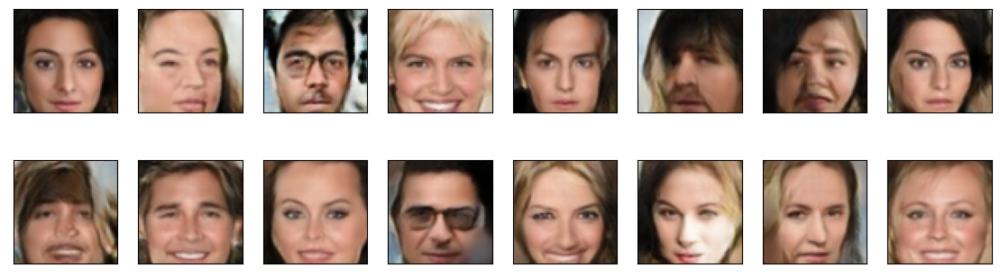

2024-03-30 02:36:04 | Epoch [8/20] | Batch 0/895 | d_loss: 0.7544 | g_loss: 1.4720
2024-03-30 02:36:14 | Epoch [8/20] | Batch 50/895 | d_loss: 0.7725 | g_loss: 1.7821
2024-03-30 02:36:25 | Epoch [8/20] | Batch 100/895 | d_loss: 0.6428 | g_loss: 3.0936
2024-03-30 02:36:36 | Epoch [8/20] | Batch 150/895 | d_loss: 1.0258 | g_loss: 2.3887
2024-03-30 02:36:47 | Epoch [8/20] | Batch 200/895 | d_loss: 0.9997 | g_loss: 2.8110
2024-03-30 02:36:57 | Epoch [8/20] | Batch 250/895 | d_loss: 0.9842 | g_loss: 3.0163
2024-03-30 02:37:08 | Epoch [8/20] | Batch 300/895 | d_loss: 0.8709 | g_loss: 1.7784
2024-03-30 02:37:18 | Epoch [8/20] | Batch 350/895 | d_loss: 0.7030 | g_loss: 2.3505
2024-03-30 02:37:30 | Epoch [8/20] | Batch 400/895 | d_loss: 0.7341 | g_loss: 2.2237
2024-03-30 02:37:41 | Epoch [8/20] | Batch 450/895 | d_loss: 0.5657 | g_loss: 1.8986
2024-03-30 02:37:51 | Epoch [8/20] | Batch 500/895 | d_loss: 0.6505 | g_loss: 1.8849
2024-03-30 02:38:02 | Epoch [8/20] | Batch 550/895 | d_loss: 0.5855 

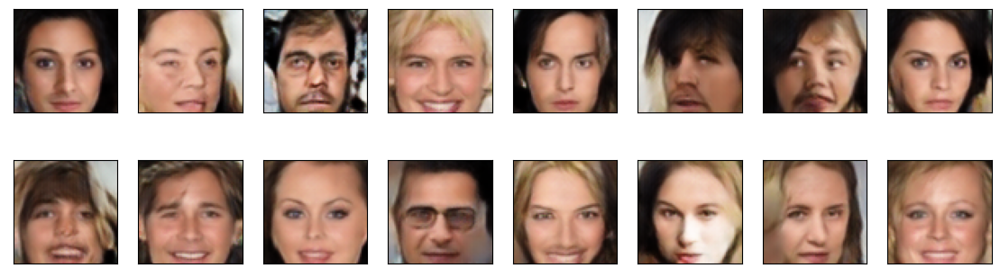

2024-03-30 02:39:18 | Epoch [9/20] | Batch 0/895 | d_loss: 0.5212 | g_loss: 1.7237
2024-03-30 02:39:30 | Epoch [9/20] | Batch 50/895 | d_loss: 0.4861 | g_loss: 2.1781
2024-03-30 02:39:41 | Epoch [9/20] | Batch 100/895 | d_loss: 1.1399 | g_loss: 2.3732
2024-03-30 02:39:51 | Epoch [9/20] | Batch 150/895 | d_loss: 0.7339 | g_loss: 2.9172
2024-03-30 02:40:02 | Epoch [9/20] | Batch 200/895 | d_loss: 0.5226 | g_loss: 3.4738
2024-03-30 02:40:13 | Epoch [9/20] | Batch 250/895 | d_loss: 0.6330 | g_loss: 2.2203
2024-03-30 02:40:23 | Epoch [9/20] | Batch 300/895 | d_loss: 0.4390 | g_loss: 2.3434
2024-03-30 02:40:34 | Epoch [9/20] | Batch 350/895 | d_loss: 0.6577 | g_loss: 3.0860
2024-03-30 02:40:45 | Epoch [9/20] | Batch 400/895 | d_loss: 0.9515 | g_loss: 2.6350
2024-03-30 02:40:56 | Epoch [9/20] | Batch 450/895 | d_loss: 0.6023 | g_loss: 2.8681
2024-03-30 02:41:06 | Epoch [9/20] | Batch 500/895 | d_loss: 0.3011 | g_loss: 2.5484
2024-03-30 02:41:17 | Epoch [9/20] | Batch 550/895 | d_loss: 0.4917 

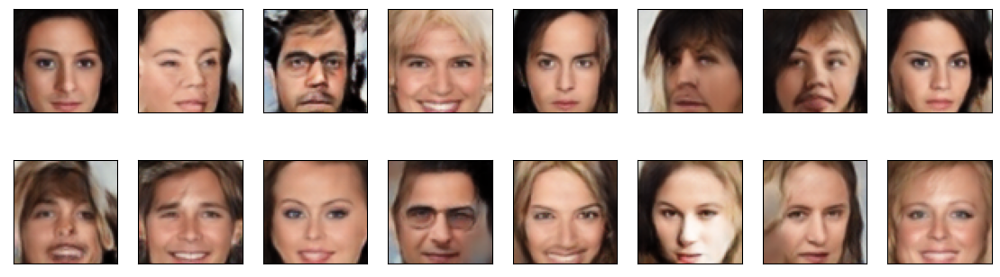

2024-03-30 02:42:37 | Epoch [10/20] | Batch 0/895 | d_loss: 0.6092 | g_loss: 2.7588
2024-03-30 02:42:47 | Epoch [10/20] | Batch 50/895 | d_loss: 0.5296 | g_loss: 2.6869
2024-03-30 02:42:58 | Epoch [10/20] | Batch 100/895 | d_loss: 0.5072 | g_loss: 2.8213
2024-03-30 02:43:09 | Epoch [10/20] | Batch 150/895 | d_loss: 0.3022 | g_loss: 2.7027
2024-03-30 02:43:19 | Epoch [10/20] | Batch 200/895 | d_loss: 0.3097 | g_loss: 3.5070
2024-03-30 02:43:30 | Epoch [10/20] | Batch 250/895 | d_loss: 0.3609 | g_loss: 3.2770
2024-03-30 02:43:41 | Epoch [10/20] | Batch 300/895 | d_loss: 0.5841 | g_loss: 3.4443
2024-03-30 02:43:52 | Epoch [10/20] | Batch 350/895 | d_loss: 0.7014 | g_loss: 2.9562
2024-03-30 02:44:02 | Epoch [10/20] | Batch 400/895 | d_loss: 0.3063 | g_loss: 5.3884
2024-03-30 02:44:13 | Epoch [10/20] | Batch 450/895 | d_loss: 0.6016 | g_loss: 2.0980
2024-03-30 02:44:24 | Epoch [10/20] | Batch 500/895 | d_loss: 0.2659 | g_loss: 3.0869
2024-03-30 02:44:34 | Epoch [10/20] | Batch 550/895 | d_l

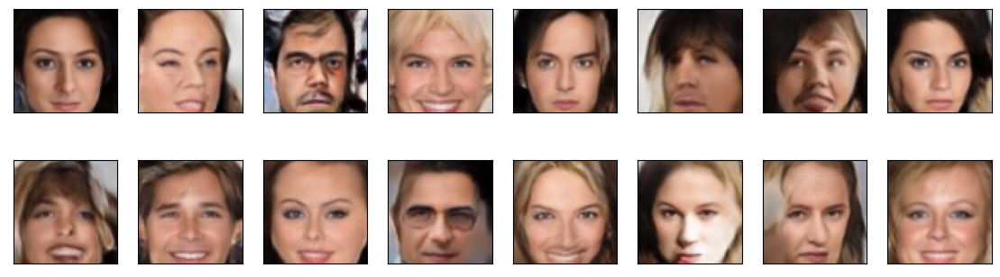

2024-03-30 02:45:52 | Epoch [11/20] | Batch 0/895 | d_loss: 0.8712 | g_loss: 5.9776
2024-03-30 02:46:03 | Epoch [11/20] | Batch 50/895 | d_loss: 0.3425 | g_loss: 3.7533
2024-03-30 02:46:13 | Epoch [11/20] | Batch 100/895 | d_loss: 0.2565 | g_loss: 2.3088
2024-03-30 02:46:24 | Epoch [11/20] | Batch 150/895 | d_loss: 0.1975 | g_loss: 2.1470
2024-03-30 02:46:35 | Epoch [11/20] | Batch 200/895 | d_loss: 0.1813 | g_loss: 3.5461
2024-03-30 02:46:45 | Epoch [11/20] | Batch 250/895 | d_loss: 0.3214 | g_loss: 3.0683
2024-03-30 02:46:56 | Epoch [11/20] | Batch 300/895 | d_loss: 0.2935 | g_loss: 3.0666
2024-03-30 02:47:07 | Epoch [11/20] | Batch 350/895 | d_loss: 0.2248 | g_loss: 2.6010
2024-03-30 02:47:17 | Epoch [11/20] | Batch 400/895 | d_loss: 0.1145 | g_loss: 2.4389
2024-03-30 02:47:28 | Epoch [11/20] | Batch 450/895 | d_loss: 0.0918 | g_loss: 4.2980
2024-03-30 02:47:39 | Epoch [11/20] | Batch 500/895 | d_loss: 0.2667 | g_loss: 3.1620
2024-03-30 02:47:49 | Epoch [11/20] | Batch 550/895 | d_l

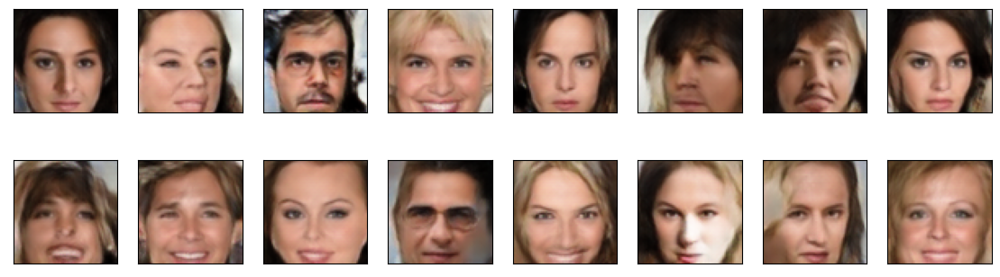

2024-03-30 02:49:13 | Epoch [12/20] | Batch 0/895 | d_loss: 0.1393 | g_loss: 3.0495
2024-03-30 02:49:24 | Epoch [12/20] | Batch 50/895 | d_loss: 0.3151 | g_loss: 2.6867
2024-03-30 02:49:34 | Epoch [12/20] | Batch 100/895 | d_loss: 0.0954 | g_loss: 2.4981
2024-03-30 02:49:45 | Epoch [12/20] | Batch 150/895 | d_loss: 0.2277 | g_loss: 2.5271
2024-03-30 02:49:56 | Epoch [12/20] | Batch 200/895 | d_loss: 0.1527 | g_loss: 4.5490
2024-03-30 02:50:06 | Epoch [12/20] | Batch 250/895 | d_loss: 0.1871 | g_loss: 5.6267
2024-03-30 02:50:17 | Epoch [12/20] | Batch 300/895 | d_loss: 0.6897 | g_loss: 6.3787
2024-03-30 02:50:28 | Epoch [12/20] | Batch 350/895 | d_loss: 0.3089 | g_loss: 3.6115
2024-03-30 02:50:39 | Epoch [12/20] | Batch 400/895 | d_loss: 0.1317 | g_loss: 5.2109
2024-03-30 02:50:50 | Epoch [12/20] | Batch 450/895 | d_loss: 0.0899 | g_loss: 4.0877
2024-03-30 02:51:00 | Epoch [12/20] | Batch 500/895 | d_loss: 0.3153 | g_loss: 3.9900
2024-03-30 02:51:11 | Epoch [12/20] | Batch 550/895 | d_l

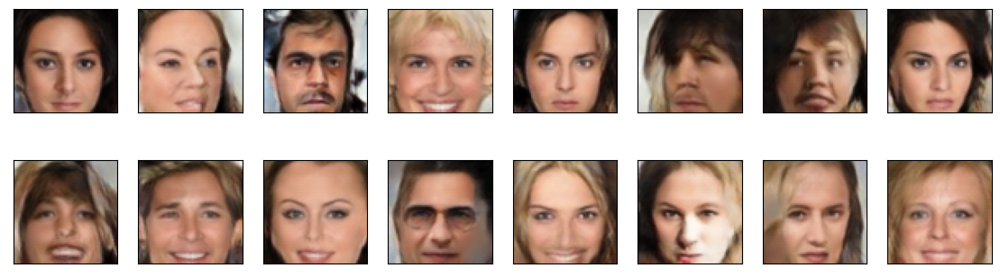

2024-03-30 02:52:27 | Epoch [13/20] | Batch 0/895 | d_loss: 0.5042 | g_loss: 2.4409
2024-03-30 02:52:38 | Epoch [13/20] | Batch 50/895 | d_loss: 0.0395 | g_loss: 4.6536
2024-03-30 02:52:49 | Epoch [13/20] | Batch 100/895 | d_loss: 0.2606 | g_loss: 3.0212
2024-03-30 02:52:59 | Epoch [13/20] | Batch 150/895 | d_loss: 0.2457 | g_loss: 5.7526
2024-03-30 02:53:10 | Epoch [13/20] | Batch 200/895 | d_loss: 0.0957 | g_loss: 3.9572
2024-03-30 02:53:21 | Epoch [13/20] | Batch 250/895 | d_loss: 0.1054 | g_loss: 3.1663
2024-03-30 02:53:31 | Epoch [13/20] | Batch 300/895 | d_loss: 0.1542 | g_loss: 6.9286
2024-03-30 02:53:42 | Epoch [13/20] | Batch 350/895 | d_loss: 0.3479 | g_loss: 2.1684
2024-03-30 02:53:53 | Epoch [13/20] | Batch 400/895 | d_loss: 0.0709 | g_loss: 4.2367
2024-03-30 02:54:03 | Epoch [13/20] | Batch 450/895 | d_loss: 0.8223 | g_loss: 4.4154
2024-03-30 02:54:14 | Epoch [13/20] | Batch 500/895 | d_loss: 0.3858 | g_loss: 4.7355
2024-03-30 02:54:25 | Epoch [13/20] | Batch 550/895 | d_l

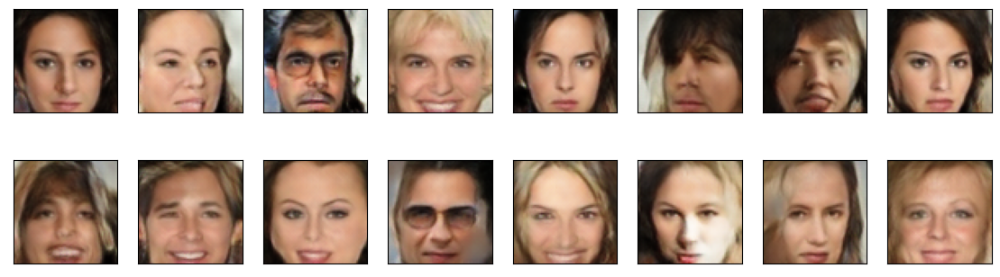

2024-03-30 02:55:45 | Epoch [14/20] | Batch 0/895 | d_loss: 0.7323 | g_loss: 3.1138
2024-03-30 02:55:55 | Epoch [14/20] | Batch 50/895 | d_loss: 0.0599 | g_loss: 5.7177
2024-03-30 02:56:06 | Epoch [14/20] | Batch 100/895 | d_loss: 0.0477 | g_loss: 4.7350
2024-03-30 02:56:17 | Epoch [14/20] | Batch 150/895 | d_loss: 0.1429 | g_loss: 6.1238
2024-03-30 02:56:27 | Epoch [14/20] | Batch 200/895 | d_loss: 0.3333 | g_loss: 6.4865
2024-03-30 02:56:38 | Epoch [14/20] | Batch 250/895 | d_loss: 0.0248 | g_loss: 4.8029
2024-03-30 02:56:49 | Epoch [14/20] | Batch 300/895 | d_loss: 0.1821 | g_loss: 6.1522
2024-03-30 02:57:00 | Epoch [14/20] | Batch 350/895 | d_loss: 0.0956 | g_loss: 9.1363
2024-03-30 02:57:10 | Epoch [14/20] | Batch 400/895 | d_loss: 0.0621 | g_loss: 3.9071
2024-03-30 02:57:21 | Epoch [14/20] | Batch 450/895 | d_loss: 0.4975 | g_loss: 5.3107
2024-03-30 02:57:32 | Epoch [14/20] | Batch 500/895 | d_loss: 0.2622 | g_loss: 5.2497
2024-03-30 02:57:42 | Epoch [14/20] | Batch 550/895 | d_l

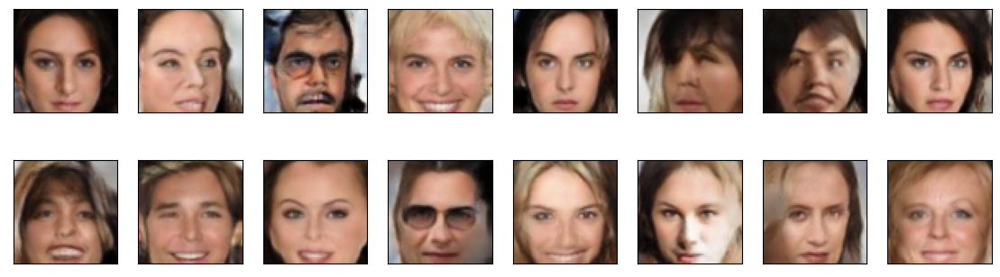

2024-03-30 02:58:59 | Epoch [15/20] | Batch 0/895 | d_loss: 0.1123 | g_loss: 7.7476
2024-03-30 02:59:10 | Epoch [15/20] | Batch 50/895 | d_loss: 0.5610 | g_loss: 6.0861
2024-03-30 02:59:21 | Epoch [15/20] | Batch 100/895 | d_loss: 0.0430 | g_loss: 4.0230
2024-03-30 02:59:31 | Epoch [15/20] | Batch 150/895 | d_loss: 0.0445 | g_loss: 3.0045
2024-03-30 02:59:42 | Epoch [15/20] | Batch 200/895 | d_loss: 0.2106 | g_loss: 6.6802
2024-03-30 02:59:53 | Epoch [15/20] | Batch 250/895 | d_loss: 0.2351 | g_loss: 8.4388
2024-03-30 03:00:03 | Epoch [15/20] | Batch 300/895 | d_loss: 0.2369 | g_loss: 5.5463
2024-03-30 03:00:14 | Epoch [15/20] | Batch 350/895 | d_loss: 0.1190 | g_loss: 6.8119
2024-03-30 03:00:25 | Epoch [15/20] | Batch 400/895 | d_loss: 0.0104 | g_loss: 7.0419
2024-03-30 03:00:35 | Epoch [15/20] | Batch 450/895 | d_loss: 0.1070 | g_loss: 6.4290
2024-03-30 03:00:46 | Epoch [15/20] | Batch 500/895 | d_loss: 0.0936 | g_loss: 7.6603
2024-03-30 03:00:57 | Epoch [15/20] | Batch 550/895 | d_l

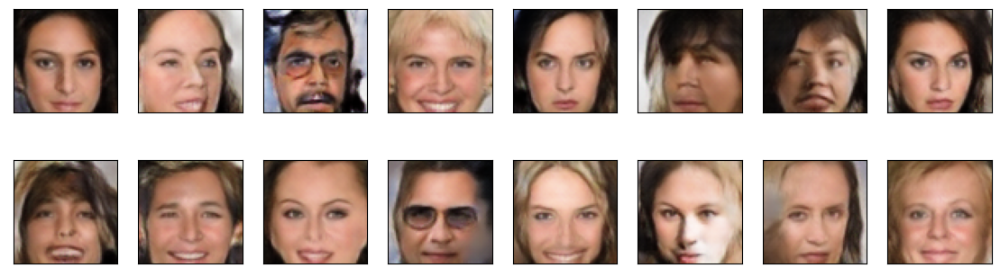

2024-03-30 03:02:12 | Epoch [16/20] | Batch 0/895 | d_loss: 0.0517 | g_loss: 5.2328
2024-03-30 03:02:23 | Epoch [16/20] | Batch 50/895 | d_loss: 0.0254 | g_loss: 6.3763
2024-03-30 03:02:34 | Epoch [16/20] | Batch 100/895 | d_loss: 0.0287 | g_loss: 5.6072
2024-03-30 03:02:44 | Epoch [16/20] | Batch 150/895 | d_loss: 0.0447 | g_loss: 6.2070
2024-03-30 03:02:55 | Epoch [16/20] | Batch 200/895 | d_loss: 0.0114 | g_loss: 4.3633
2024-03-30 03:03:08 | Epoch [16/20] | Batch 250/895 | d_loss: 0.0361 | g_loss: 4.8631
2024-03-30 03:03:19 | Epoch [16/20] | Batch 300/895 | d_loss: 0.0078 | g_loss: 4.9485
2024-03-30 03:03:30 | Epoch [16/20] | Batch 350/895 | d_loss: 0.2169 | g_loss: 5.1565
2024-03-30 03:03:41 | Epoch [16/20] | Batch 400/895 | d_loss: 0.0265 | g_loss: 7.2168
2024-03-30 03:03:51 | Epoch [16/20] | Batch 450/895 | d_loss: 0.0722 | g_loss: 6.9136
2024-03-30 03:04:02 | Epoch [16/20] | Batch 500/895 | d_loss: 0.0627 | g_loss: 4.6414
2024-03-30 03:04:13 | Epoch [16/20] | Batch 550/895 | d_l

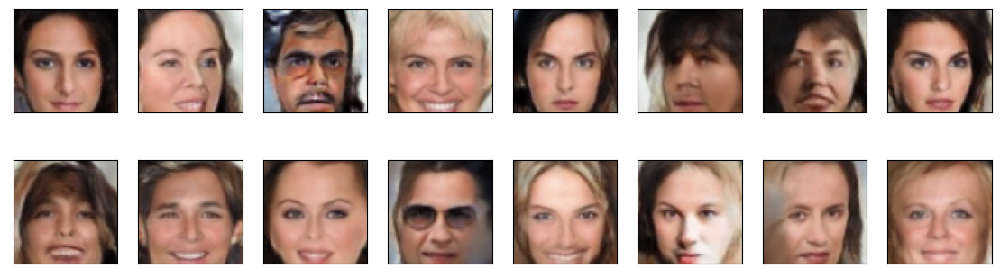

2024-03-30 03:05:33 | Epoch [17/20] | Batch 0/895 | d_loss: 0.0881 | g_loss: 7.1827
2024-03-30 03:05:44 | Epoch [17/20] | Batch 50/895 | d_loss: 0.0084 | g_loss: 9.4405
2024-03-30 03:05:54 | Epoch [17/20] | Batch 100/895 | d_loss: 0.0193 | g_loss: 6.2700
2024-03-30 03:06:05 | Epoch [17/20] | Batch 150/895 | d_loss: 0.0233 | g_loss: 7.9211
2024-03-30 03:06:16 | Epoch [17/20] | Batch 200/895 | d_loss: 0.1713 | g_loss: 6.6367
2024-03-30 03:06:26 | Epoch [17/20] | Batch 250/895 | d_loss: 0.0132 | g_loss: 6.8207
2024-03-30 03:06:37 | Epoch [17/20] | Batch 300/895 | d_loss: 0.0089 | g_loss: 5.3119
2024-03-30 03:06:48 | Epoch [17/20] | Batch 350/895 | d_loss: 0.0365 | g_loss: 7.6346
2024-03-30 03:06:58 | Epoch [17/20] | Batch 400/895 | d_loss: 0.0236 | g_loss: 6.0139
2024-03-30 03:07:09 | Epoch [17/20] | Batch 450/895 | d_loss: 0.0255 | g_loss: 7.8471
2024-03-30 03:07:20 | Epoch [17/20] | Batch 500/895 | d_loss: 0.0355 | g_loss: 5.7811
2024-03-30 03:07:32 | Epoch [17/20] | Batch 550/895 | d_l

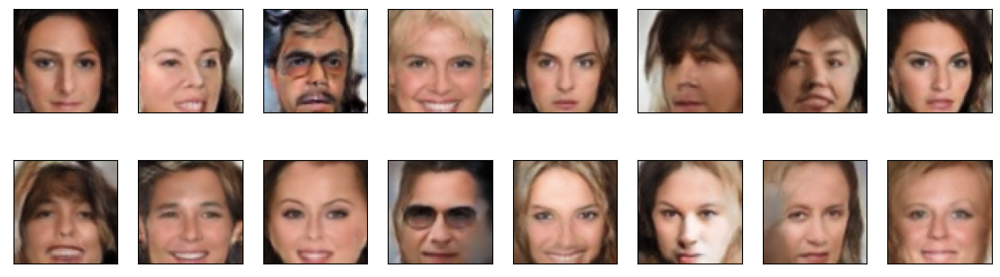

2024-03-30 03:08:47 | Epoch [18/20] | Batch 0/895 | d_loss: 0.0199 | g_loss: 7.4145
2024-03-30 03:08:58 | Epoch [18/20] | Batch 50/895 | d_loss: 0.0244 | g_loss: 5.5879
2024-03-30 03:09:09 | Epoch [18/20] | Batch 100/895 | d_loss: 0.0031 | g_loss: 10.4474
2024-03-30 03:09:19 | Epoch [18/20] | Batch 150/895 | d_loss: 0.0600 | g_loss: 5.5144
2024-03-30 03:09:30 | Epoch [18/20] | Batch 200/895 | d_loss: 0.0201 | g_loss: 6.7689
2024-03-30 03:09:46 | Epoch [18/20] | Batch 250/895 | d_loss: 0.0119 | g_loss: 5.3608
2024-03-30 03:09:57 | Epoch [18/20] | Batch 300/895 | d_loss: 0.0281 | g_loss: 8.0368
2024-03-30 03:10:08 | Epoch [18/20] | Batch 350/895 | d_loss: 0.0114 | g_loss: 8.7247
2024-03-30 03:10:18 | Epoch [18/20] | Batch 400/895 | d_loss: 0.0103 | g_loss: 7.9051
2024-03-30 03:10:29 | Epoch [18/20] | Batch 450/895 | d_loss: 0.0444 | g_loss: 8.4776
2024-03-30 03:10:40 | Epoch [18/20] | Batch 500/895 | d_loss: 0.0428 | g_loss: 6.1111
2024-03-30 03:10:50 | Epoch [18/20] | Batch 550/895 | d_

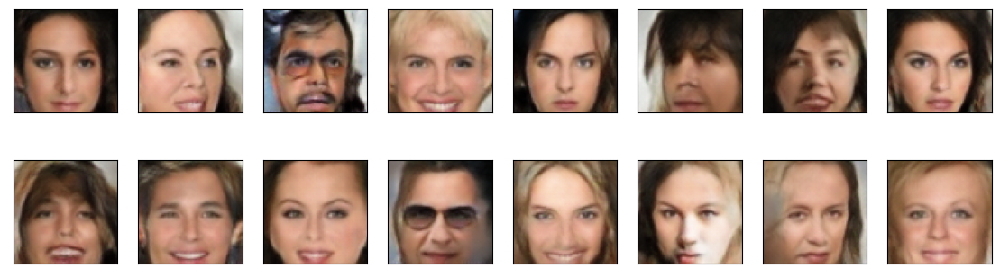

2024-03-30 03:12:07 | Epoch [19/20] | Batch 0/895 | d_loss: 0.0106 | g_loss: 8.1961
2024-03-30 03:12:18 | Epoch [19/20] | Batch 50/895 | d_loss: 0.0220 | g_loss: 8.7531
2024-03-30 03:12:28 | Epoch [19/20] | Batch 100/895 | d_loss: 0.0160 | g_loss: 8.3963
2024-03-30 03:12:39 | Epoch [19/20] | Batch 150/895 | d_loss: 0.0296 | g_loss: 8.4594
2024-03-30 03:12:50 | Epoch [19/20] | Batch 200/895 | d_loss: 0.0034 | g_loss: 7.1773
2024-03-30 03:13:00 | Epoch [19/20] | Batch 250/895 | d_loss: 0.0121 | g_loss: 7.9641
2024-03-30 03:13:11 | Epoch [19/20] | Batch 300/895 | d_loss: 0.0421 | g_loss: 5.4887
2024-03-30 03:13:22 | Epoch [19/20] | Batch 350/895 | d_loss: 0.0021 | g_loss: 4.7467
2024-03-30 03:13:32 | Epoch [19/20] | Batch 400/895 | d_loss: 0.0045 | g_loss: 7.7202
2024-03-30 03:13:43 | Epoch [19/20] | Batch 450/895 | d_loss: 0.0595 | g_loss: 7.6425
2024-03-30 03:13:54 | Epoch [19/20] | Batch 500/895 | d_loss: 0.0087 | g_loss: 7.0038
2024-03-30 03:14:05 | Epoch [19/20] | Batch 550/895 | d_l

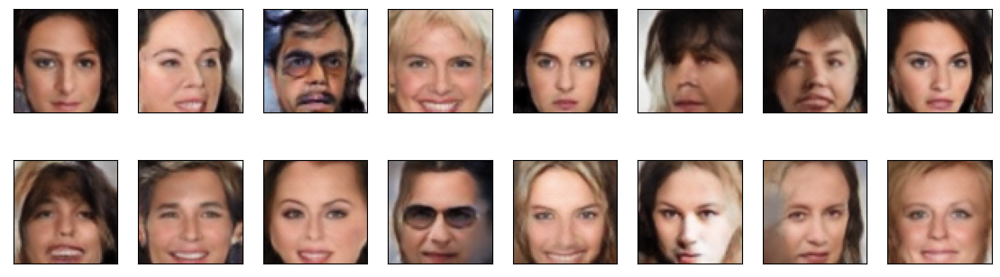

2024-03-30 03:15:20 | Epoch [20/20] | Batch 0/895 | d_loss: 0.0053 | g_loss: 10.5406
2024-03-30 03:15:31 | Epoch [20/20] | Batch 50/895 | d_loss: 0.0361 | g_loss: 5.0400
2024-03-30 03:15:42 | Epoch [20/20] | Batch 100/895 | d_loss: 0.0120 | g_loss: 8.0820
2024-03-30 03:15:53 | Epoch [20/20] | Batch 150/895 | d_loss: 0.0086 | g_loss: 5.6259
2024-03-30 03:16:10 | Epoch [20/20] | Batch 200/895 | d_loss: 0.0043 | g_loss: 8.0258
2024-03-30 03:16:20 | Epoch [20/20] | Batch 250/895 | d_loss: 0.0389 | g_loss: 6.6815
2024-03-30 03:16:31 | Epoch [20/20] | Batch 300/895 | d_loss: 0.0090 | g_loss: 6.1852
2024-03-30 03:16:42 | Epoch [20/20] | Batch 350/895 | d_loss: 0.0060 | g_loss: 6.2972
2024-03-30 03:16:53 | Epoch [20/20] | Batch 400/895 | d_loss: 0.0226 | g_loss: 5.3488
2024-03-30 03:17:03 | Epoch [20/20] | Batch 450/895 | d_loss: 0.0062 | g_loss: 7.8392
2024-03-30 03:17:14 | Epoch [20/20] | Batch 500/895 | d_loss: 0.5010 | g_loss: 12.6778
2024-03-30 03:17:25 | Epoch [20/20] | Batch 550/895 | d

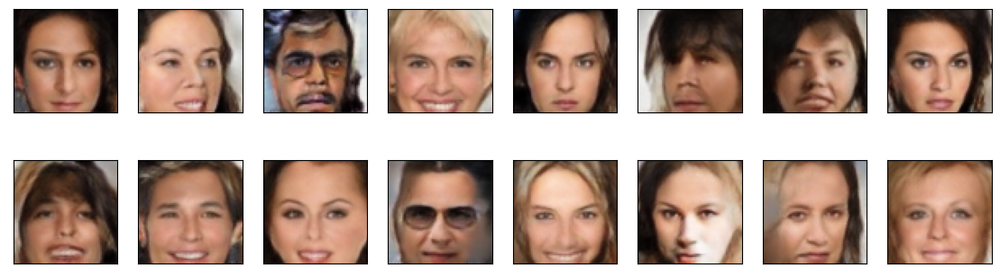

In [10]:
losses, samples = training(model_G, model_D, z_size, g_optimizer, d_optimizer, generator_loss, discriminator_loss, g_scheduler, d_scheduler, num_epochs, train_loader, print_every=50, device='cuda')

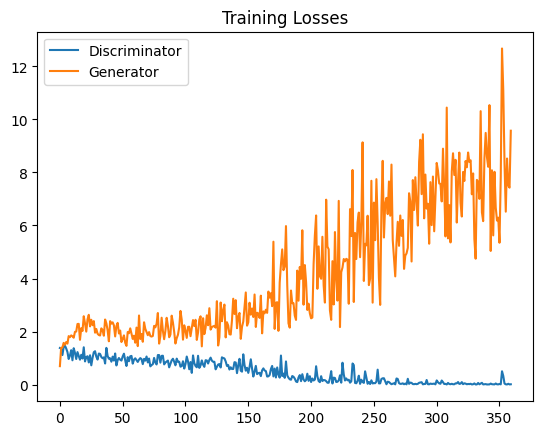

In [12]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator')
plt.plot(losses.T[1], label='Generator')
plt.title("Training Losses")
plt.legend()

In [13]:
import pickle as pkl
from training_helper import view_samples

In [14]:
# Load samples from generator, taken while training
with open('train_samples.pkl', 'rb') as f:
    samples = pkl.load(f)

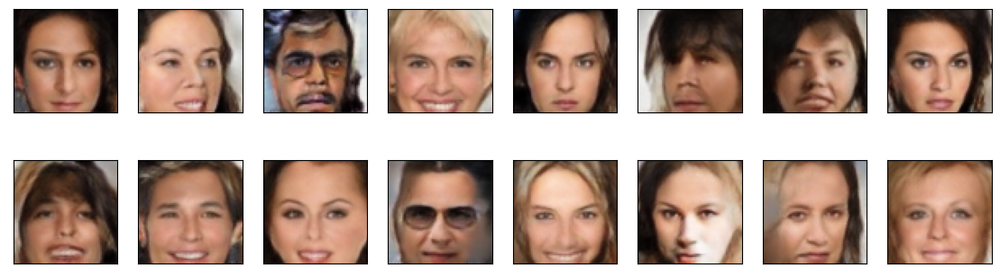

In [15]:
# -1 indicates final epoch's samples (the last in the list)
view_samples(-1, samples)

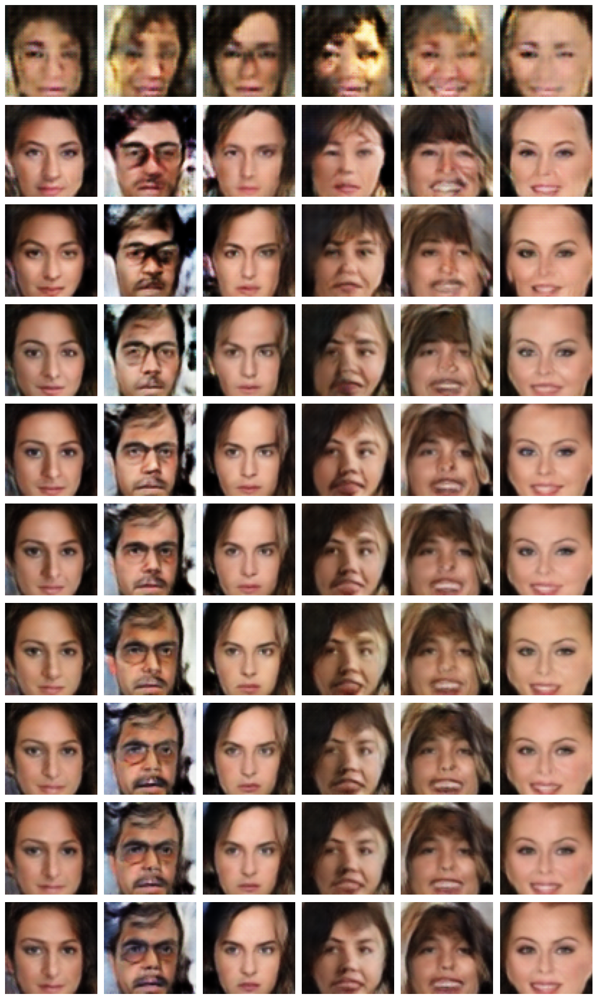

In [19]:
import matplotlib.pyplot as plt

def display_images(samples, rows, cols):
    fig, axes = plt.subplots(figsize=(cols * 2, rows * 2), nrows=rows, ncols=cols, sharex=True, sharey=True)
    
    for i, sample in enumerate(samples[::int(len(samples) / rows)]):
        images = sample[::int(len(sample) / cols)]
        for j, img in enumerate(images):
            if j >= cols:
                break
            
            img = img.detach().cpu().numpy().transpose((1, 2, 0))
            img = ((img + 1) / 2)  # Rescale from [-1, 1] to [0, 1]
            img = img.clip(0, 1)  # Clip values outside the range [0, 1]
            
            ax = axes[i, j]
            ax.imshow(img)
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Assuming you have a list of generated images called 'samples'
rows = 10  # Number of rows in the grid
cols = 6   # Number of columns in the grid

display_images(samples, rows, cols)

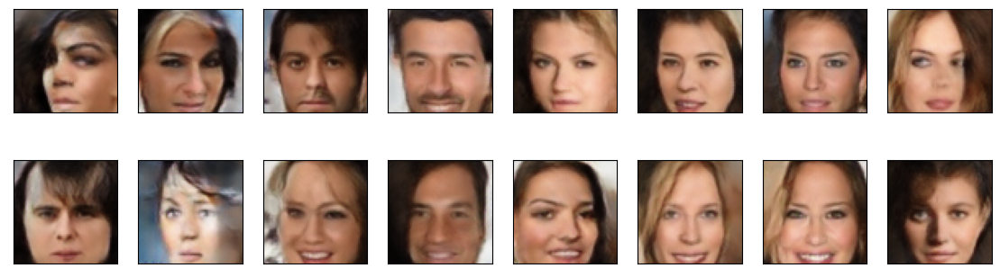

In [35]:
# randomly generated, new latent vectors
sample_size = 16
rand_z = torch.randn(sample_size, z_size, 1, 1).float().to(device)

model_G.eval()  # eval mode
# generated samples
rand_images = G(rand_z)

# 0 indicates the first set of samples in the passed in list
# and we only have one batch of samples, here
view_samples(0, [rand_images])